In [142]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="YtyrDCKE66lT00Mp2Kng")
project = rf.workspace("raghad-abo-el-eneen").project("sea-creatures-detection")
version = project.version(17)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.196`, to intall it `pip install ultralytics==8.0.196`.


#  DATASET-1 SEA CREATURE DETECTION USING CNN 

# Importing necessary libraries and modules for this notebook

In [10]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.optimizers import Adam # - Works
import seaborn as sns
from tensorflow.keras.losses import SparseCategoricalCrossentropy
import matplotlib.pyplot as plt
import matplotlib.image as img
import warnings
warnings.filterwarnings('ignore')
#Data Handling & Linear Algebra
import numpy as np
import pandas as pd
import os

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

#Manipulating Data and Model Building
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.python.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

#Implementation of Transfer Learning
from tensorflow.keras.applications import MobileNetV2

#Image generation and preprocessing
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Result and Performance Analysis
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
#Ignoring Warnings
import warnings
warnings.filterwarnings("ignore")

# Exploratory Analysis

In [4]:
train_dir = r'C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train'
validation_dir = r'C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\valid'
test_dir =r'C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\test'

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [6]:
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,          ## flow_from_directory will feed images to train_generator in batches of 20.
        class_mode='categorical')

Found 1714 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [75]:
import random  # Import the random module

batch_size = 32
img_height = 180
img_width = 180
rnd_seed = 123
random.seed(rnd_seed)


In [76]:
for image_class in os.listdir(train_dir):
    print(image_class)

images
labels
labels.cache


In [7]:
label = []
path = []

for dirname, _,filenames in os.walk(train_dir):                    
    for filename in filenames:                                 
        if os.path.splitext(filename)[-1]=='.jpg':               # If filename contains .png
                label.append(os.path.split(dirname)[-1])         # Append the directory name to label 
                path.append(os.path.join(dirname,filename))     # Append all the png files to path of that directory

# Ready to create the df
df = pd.DataFrame(columns=['path','label'])
df['path']=path
df['label']=label

In [8]:
df.head()

,path,label
0,C:\Users\Venus\Downloads\Sea-Creatures-Detecti...,images
1,C:\Users\Venus\Downloads\Sea-Creatures-Detecti...,images
2,C:\Users\Venus\Downloads\Sea-Creatures-Detecti...,images
3,C:\Users\Venus\Downloads\Sea-Creatures-Detecti...,images
4,C:\Users\Venus\Downloads\Sea-Creatures-Detecti...,images


In [79]:
df.path[0]

'C:\\Users\\Venus\\Downloads\\Sea-Creatures-Detection.v17i.yolov8\\train\\images\\0_jpg.rf.9bec5191a49569c9672acd8ad4d38775.jpg'

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1714 entries, 0 to 1713
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   path    1714 non-null   object
 1   label   1714 non-null   object
dtypes: object(2)
memory usage: 26.9+ KB


In [81]:
#Checking the value counts of each of the datasets
#df['label']=df['label'].astype('category')
df['label'].value_counts()

images    1714
Name: label, dtype: int64

In [82]:
df['path'].value_counts()

C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train\images\0_jpg.rf.9bec5191a49569c9672acd8ad4d38775.jpg              1
C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train\images\frame6735_jpg.rf.66ccc21d2cff47f4e72392640413bf52.jpg      1
C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train\images\frame6734_jpg.rf.3a8dce43b76d6579a340f918fa5f4a15.jpg      1
C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train\images\frame6734_jpg.rf.0853728844485d16cdaa44198096d426.jpg      1
C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train\images\frame6731_jpg.rf.effa06cd06f99b35c578c26baa3d167e.jpg      1
                                                                                                                                    ..
C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.yolov8\train\images\frame14042_jpg.rf.d43c07becd511726c447c58b6902de06.jpg     1
C:\Users\Venus\Downloads\Sea-Creatures-Detection.v17i.y

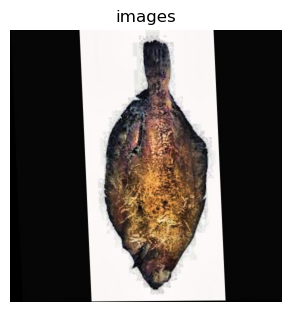

In [83]:
idx = 0
plt.figure(figsize=(15,12))
for unique_label in df['label'].unique():
    plt.subplot(3, 3, idx+1)
    plt.imshow(plt.imread(df[df['label']==unique_label].iloc[0,0]))
    plt.title(unique_label)
    plt.axis('off')
    idx+=1

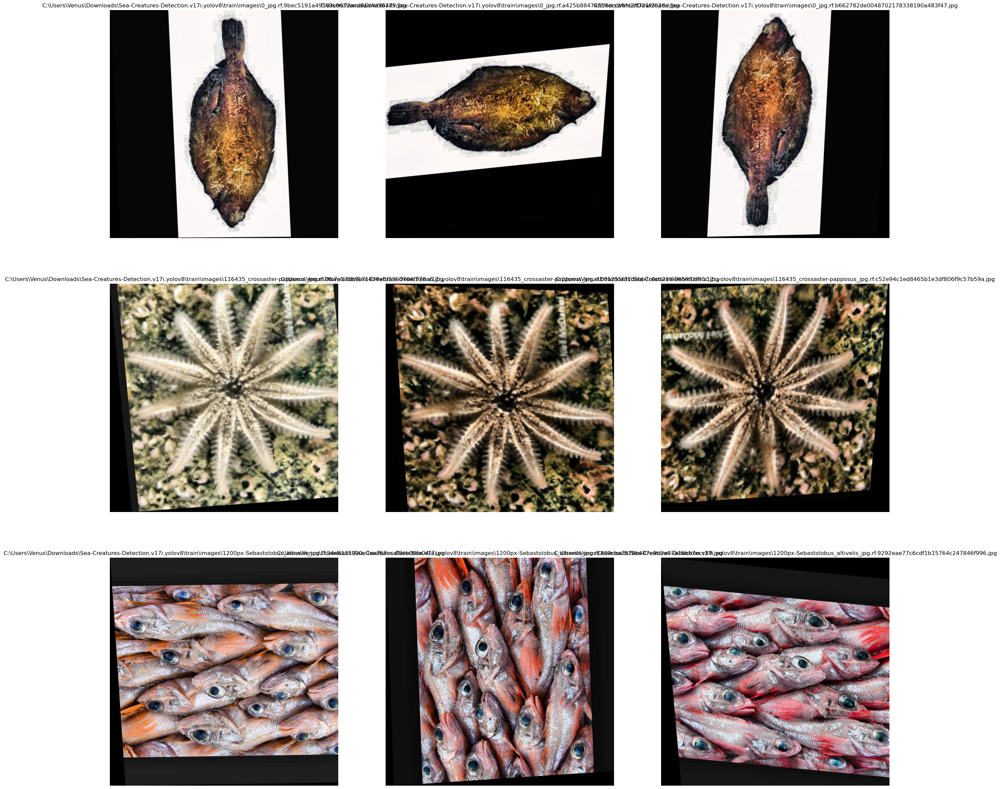

In [84]:
idx = 0
plt.figure(figsize=(30, 30))
for unique_label in df['path'].unique():
    if idx < 9:  # Ensure idx does not exceed 9
        plt.subplot(3, 3, idx + 1)
        plt.imshow(plt.imread(df[df['path'] == unique_label].iloc[0, 0]))
        plt.title(unique_label)
        plt.axis('off')
        idx += 1
    else:
        break  # Break the loop if idx exceeds 9


In [85]:
def plot_random_images():
    """
    Plots 20 Random Images from the dataset
    """
    
    images, labels = train_generator.next()
    labels = labels.astype('int32')
    i = 1

    plt.figure(figsize = (10, 10))
    
    for image, label in zip(images, labels):
        plt.subplot(4, 5, i)
        plt.imshow(image)
        plt.axis('off')
        i += 1
        if i == 21:
            break

    plt.tight_layout()       
    plt.show()

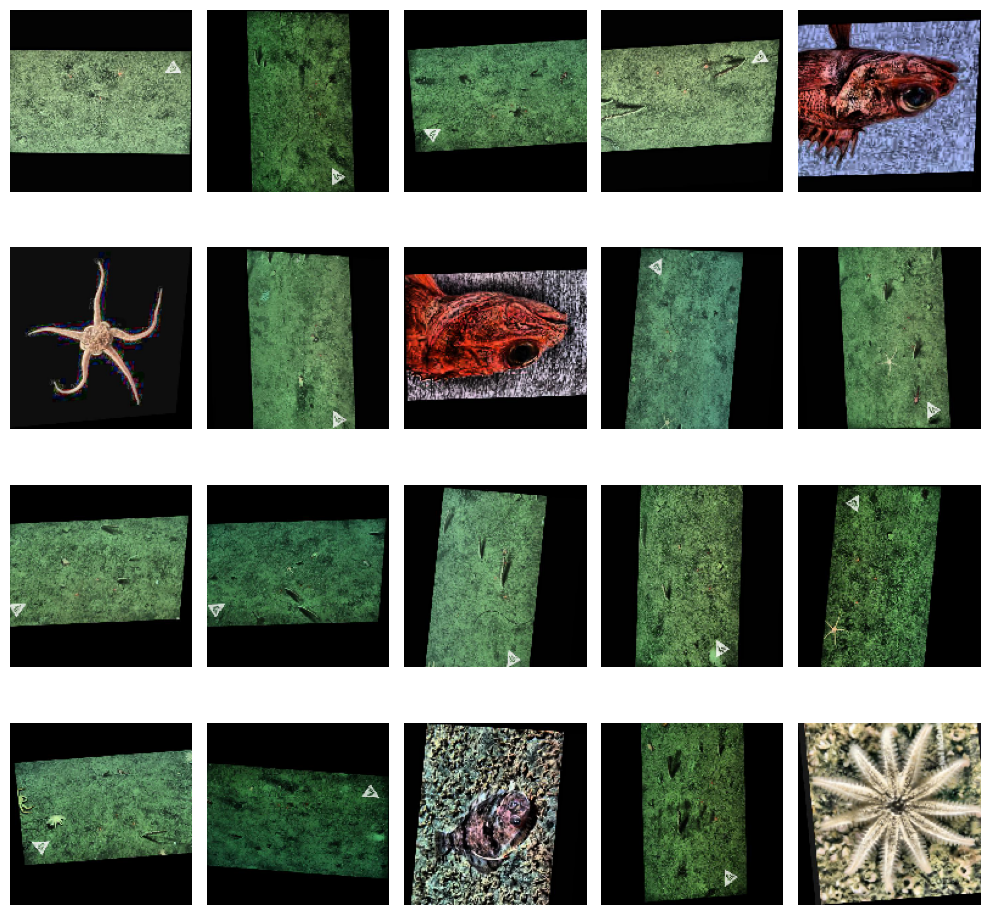

In [205]:
plot_random_images()

In [86]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense


In [87]:
num_classes = 14
img_height, img_width = 150, 150

model = Sequential([
    layers.experimental.preprocessing.Rescaling(1.0/255, input_shape=(img_height, img_width, 3)),
    
    Conv2D(32, 3, padding="same", activation='relu'),
    MaxPooling2D(),
    
    Conv2D(64, 3, padding="same", activation='relu'),
    MaxPooling2D(),
    
    Conv2D(128, 3, padding="same", activation='relu'),
    MaxPooling2D(),
    
    Conv2D(256, 3, padding="same", activation='relu'),
    MaxPooling2D(),
    
    Conv2D(512, 3, padding="same", activation='relu'),
    MaxPooling2D(),
    
    Flatten(),
    Dense(1024, activation="relu"),
    Dense(units=num_classes, activation='softmax')
])

In [88]:
opt = Adam(lr=0.001)
model.compile(optimizer= opt,
              loss= SparseCategoricalCrossentropy,
              metrics=['accuracy'])

In [89]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 75, 75, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 37, 37, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 37, 37, 128)       7

In [92]:
from tensorflow.keras import layers
from tensorflow.keras import models

In [117]:
model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))     ## The input shape over here will be 75,75 because of Maxpooling
model.add(layers.MaxPooling2D((2, 2)))                      ## Adding Maxpool in conv2D will continue to reduce the dimension.

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(512, activation='relu'))

model.add(layers.Dense(1, activation='softmax')) #Finally, this adds the output layer with a single neuron (since it's a binary classification problem) and sigmoid activation function, which outputs a value between 0 and 1 representing the probability of the input image belonging to the positive class.

In [118]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 17, 17, 128)      

In [119]:
from tensorflow.keras import optimizers #This code is configuring the training process for a neural network model using the Keras API from TensorFlow
# Optimizers are algorithms used to update the weights of the neural network during training in order to minimize the loss function
model.compile(loss='SparseCategoricalCrossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),# RMSprop (Root Mean Square Propagation)
              metrics=['acc'])

In [120]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [121]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [33]:
history = model.fit(
      train_generator,
      steps_per_epoch=100,   ## batch size is 20, 2000 images in train, 2000/20 =100 will be steps per epoch
      epochs=20,             ## Iterative
      validation_data=validation_generator,# Validation data is used to evaluate the performance of the model on data that it hasn't seen during training, helping to monitor for overfitting.
      validation_steps=50)   ## 1000 images, hence steps=1000/20=50

Epoch 1/20
 54/100 [===============>..............] - ETA: 36s - loss: 0.6932 - acc: 0.5000WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 2000 batches). You may need to use the repeat() function when building your dataset.


100/100 [==============================] - 45s 445ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6932 - val_acc: 0.5000


In [35]:
epochs = 20
history = model.fit(
  train_generator,
  steps_per_epoch=train_generator.samples // train_generator.batch_size,
  validation_data=validation_generator,
  validation_steps=validation_generator.samples // validation_generator.batch_size,
  epochs=epochs
)


Epoch 1/20
53/53 [==============================] - 46s 872ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6932 - val_acc: 0.5000
Epoch 2/20
53/53 [==============================] - 41s 773ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6932 - val_acc: 0.5000
Epoch 3/20
53/53 [==============================] - 43s 799ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6932 - val_acc: 0.5000
Epoch 4/20
53/53 [==============================] - 41s 771ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6932 - val_acc: 0.5000
Epoch 5/20
53/53 [==============================] - 41s 770ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6932 - val_acc: 0.5000
Epoch 6/20
53/53 [==============================] - 42s 781ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 7/20
53/53 [==============================] - 42s 781ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 8/20
53/53 [==============================] - 43s 798ms/step - 

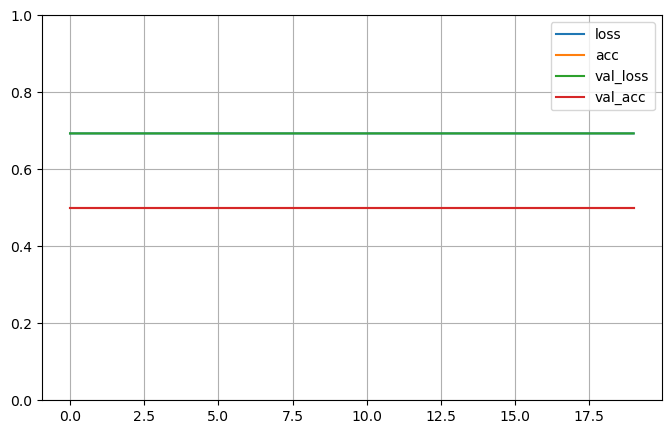

In [36]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

#  Save the model

In [37]:
model.save("sea_model.h5")

In [38]:
from tensorflow.keras import backend as K 

K.clear_session()
del model

# Data augmentation

In [39]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

test_datagen = ImageDataGenerator(rescale=1./255)
#Generating batches of augmented data (train_generator and validation_generator):
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical')


Found 1714 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5)) ## Dropout is used to deactivate 50% of the neurons randomly at each epoch.Important layer when model overfits
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

In [50]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [51]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [53]:
epochs = 10
history = model.fit(
  train_generator,
  steps_per_epoch=train_generator.samples // train_generator.batch_size,
  validation_data=validation_generator,
  validation_steps=validation_generator.samples // validation_generator.batch_size,
  epochs=epochs
)


Epoch 1/10
53/53 [==============================] - 52s 967ms/step - loss: 0.6933 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 2/10
53/53 [==============================] - 48s 895ms/step - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 3/10
53/53 [==============================] - 59s 1s/step - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 4/10
53/53 [==============================] - 56s 1s/step - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 5/10
53/53 [==============================] - 53s 993ms/step - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 6/10
53/53 [==============================] - 56s 1s/step - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 7/10
53/53 [==============================] - 64s 1s/step - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 8/10
53/53 [==============================] - 57s 1s/step - loss: 0.6931 - 

In [54]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet',    # These are weights used in the competition
                  include_top=False,     # Set false to import only the base not the dense layers
                  input_shape=(150, 150, 3))

58889256/58889256 [==============================] - 4s 0us/step


In [55]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [57]:
from tensorflow.keras import models
from tensorflow.keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [58]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 8192)              0         
                                                                 
 dense_9 (Dense)             (None, 256)               2097408   
                                                                 
 dense_10 (Dense)            (None, 1)                 257       
                                                                 
Total params: 16812353 (64.13 MB)
Trainable params: 16812353 (64.13 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [59]:
# Try LR at e-5
from tensorflow.keras import optimizers

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-2),
              metrics=['acc'])

In [60]:
checkpoint_cb = keras.callbacks.ModelCheckpoint("CNN_Project_Model-{epoch:02d}.h5")

In [ ]:
history = model.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=50,
      callbacks=[checkpoint_cb])

Epoch 1/20
 15/100 [===>..........................] - ETA: 27:10 - loss: 436016657727488.0000 - acc: 0.5000

#  DATASET-3  Fish Species Detection & Recognition using Deep Learning

# Introduction to the Problem

Estimating the relative abundance of fish species in their habitats on a regular basis and keeping an eye on population fluctuations are crucial tasks for marine scientists and conservationists. Diverse automatic computer-based fish sample methods have been demonstrated in underwater photos and videos as alternatives to time-consuming hand sampling. There isn't, however, a perfect method for automatically detecting fish and classifying their species. This is mostly due to the difficulties in producing clear underwater images and videos, which include environmental fluctuations in lighting, fish camouflage, dynamic backdrops, murky water, low resolution, shape deformations of moving fish, and tiny variances between some fish species.

In [11]:
DIR_1 = r'C:\Users\Venus\Downloads\archive (2)\Fish_Dataset\Fish_Dataset' #Creating a master directory
classes = [i for i in os.listdir(DIR_1) if '.' not in i]                     #Creating classes out of the required folders
classes

['Black Sea Sprat',
 'Gilt-Head Bream',
 'Hourse Mackerel',
 'Red Mullet',
 'Red Sea Bream',
 'Sea Bass',
 'Shrimp',
 'Striped Red Mullet',
 'Trout']

In [4]:
#Since the GT images are of no use to us for the analysis, we will be separating them out of our directory

# Create a dataframe with a column which consists of all the filepaths (without GT) and its respective label as the other column

label = []
path = []

for dirname, _,filenames in os.walk(DIR_1):                    
    for filename in filenames:                                 
        if os.path.splitext(filename)[-1]=='.jpg':               # If filename contains .png
            if dirname.split()[-1]!='GT':                       # If directory doesn't contain GT
                label.append(os.path.split(dirname)[-1])         # Append the directory name to label 
                path.append(os.path.join(dirname,filename))     # Append all the png files to path of that directory

# Ready to create the df
df = pd.DataFrame(columns=['path','label'])
df['path']=path
df['label']=label

In [5]:
df.head()

,path,label
0,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Black Sea Sprat
1,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Black Sea Sprat
2,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Black Sea Sprat
3,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Black Sea Sprat
4,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Black Sea Sprat


In [8]:
df.path[0]

'C:\\Users\\Venus\\Downloads\\archive (2)\\Fish_Dataset\\Fish_Dataset\\Black Sea Sprat\\Black Sea Sprat\\00001.png'

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   path    9000 non-null   object
 1   label   9000 non-null   object
dtypes: object(2)
memory usage: 140.8+ KB


In [10]:
#Checking the value counts of each of the datasets
#df['label']=df['label'].astype('category')
df['label'].value_counts()


Black Sea Sprat       1000
Gilt-Head Bream       1000
Hourse Mackerel       1000
Red Mullet            1000
Red Sea Bream         1000
Sea Bass              1000
Shrimp                1000
Striped Red Mullet    1000
Trout                 1000
Name: label, dtype: int64

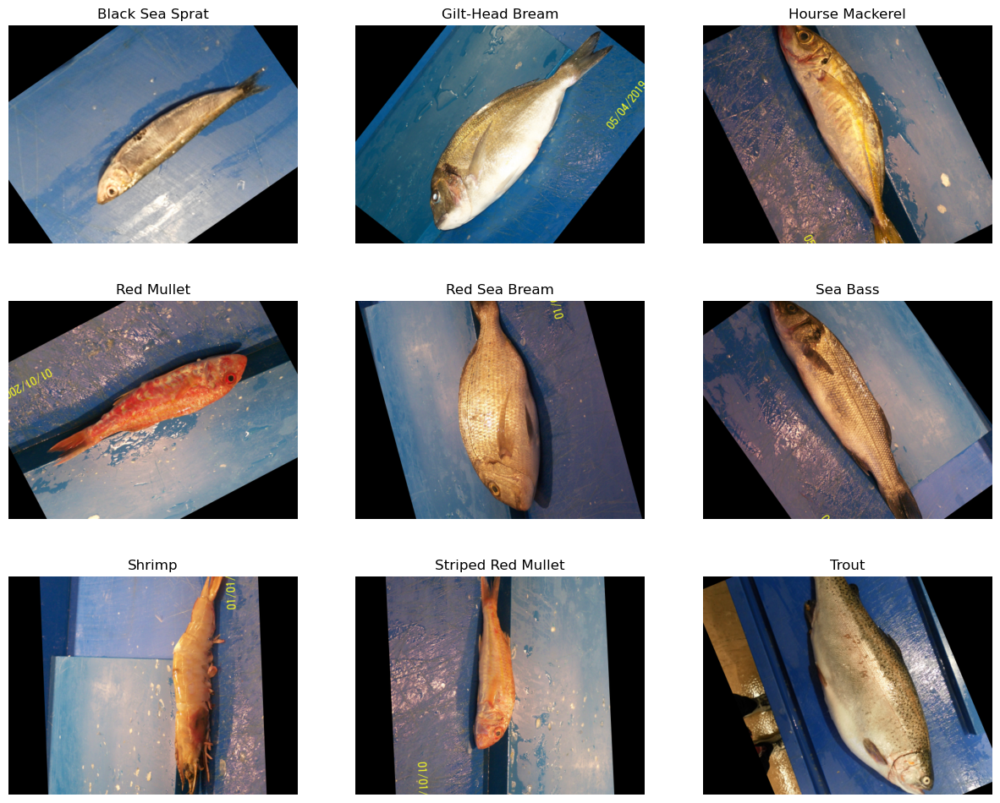

In [11]:
idx = 0
plt.figure(figsize=(15,12))
for unique_label in df['label'].unique():
    plt.subplot(3, 3, idx+1)
    plt.imshow(plt.imread(df[df['label']==unique_label].iloc[0,0]))
    plt.title(unique_label)
    plt.axis('off')
    idx+=1

In [12]:
#Creating the test train split with shuffle
train_df, test_df = train_test_split(df, train_size=0.8, shuffle=True, random_state=42)


In [13]:
#Checking the shaoe of the newly obtained data
print(train_df.shape)
print(test_df.shape)

(7200, 2)
(1800, 2)


# Image Generation and Preprocessing

In [14]:
#Using Keras Image Data Generator to preprocess our images with the model we wish to use
train_generator = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)
test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)


In [16]:
train_images = train_generator.flow_from_dataframe(dataframe=train_df, x_col='path', y_col='label', target_size=(224, 224), color_mode='rgb', class_mode='categorical', batch_size=32, shuffle=True, seed=42, subset='training')
val_images = train_generator.flow_from_dataframe(dataframe=train_df, x_col='path', y_col='label', target_size=(224, 224), color_mode='rgb', class_mode='categorical', batch_size=32, shuffle=True, seed=42, subset='validation' )
test_images = test_generator.flow_from_dataframe(dataframe=test_df, x_col='path', y_col='label', target_size=(224, 224), color_mode='rgb', class_mode='categorical', batch_size=32, shuffle=False )

Found 5760 validated image filenames belonging to 9 classes.
Found 1440 validated image filenames belonging to 9 classes.
Found 1800 validated image filenames belonging to 9 classes.


In [17]:
display(train_images.class_indices)
display(val_images.class_indices)
display(test_images.class_indices)

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


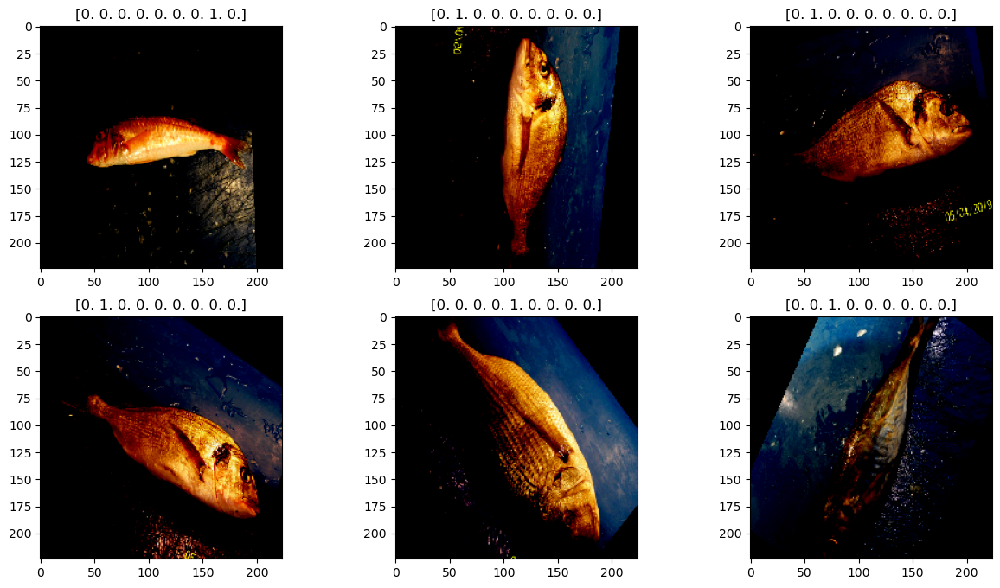

In [18]:
fit, ax= plt.subplots(nrows=2, ncols=3, figsize=(15,8))
ax=ax.flatten()
j=0
for _ in range(6):
    img, label = test_images.next()
    ax[j].imshow(img[0],)
    ax[j].set_title(label[0])
    j=j+1

# Model Training and Evaluation

In [23]:
#Importing our pretrained model : MobileNetV2

pretrained_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

In [24]:
#Creating our model inputs
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)
outputs = tf.keras.layers.Dense(9, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']      

In [25]:
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])


In [26]:
history = model.fit(train_images,
                    validation_data=val_images,
                    epochs=5)

Epoch 1/5
180/180 [==============================] - 240s 1s/step - loss: 0.1825 - accuracy: 0.9509 - val_loss: 0.0122 - val_accuracy: 0.9986
Epoch 2/5
180/180 [==============================] - 229s 1s/step - loss: 0.0093 - accuracy: 0.9988 - val_loss: 0.0099 - val_accuracy: 0.9972
Epoch 3/5
180/180 [==============================] - 229s 1s/step - loss: 0.0031 - accuracy: 0.9997 - val_loss: 0.0654 - val_accuracy: 0.9771
Epoch 4/5
180/180 [==============================] - 228s 1s/step - loss: 0.0054 - accuracy: 0.9988 - val_loss: 0.0090 - val_accuracy: 0.9972
Epoch 5/5
180/180 [==============================] - 228s 1s/step - loss: 0.0196 - accuracy: 0.9937 - val_loss: 0.0215 - val_accuracy: 0.9937


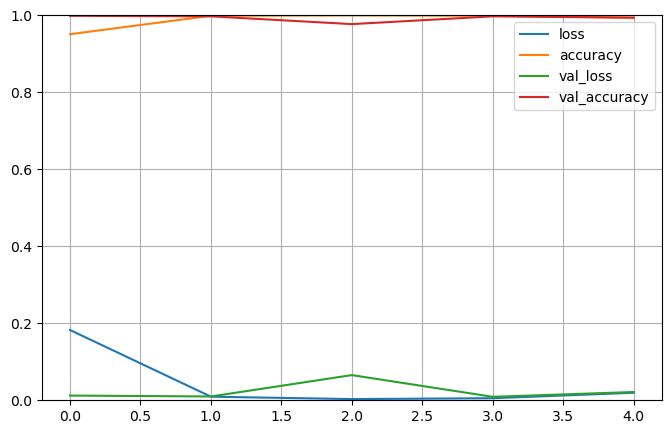

In [27]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [28]:
results = model.evaluate(test_images, verbose=0)
print("Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

Test Loss: 0.02185
Test Accuracy: 99.33%


In [29]:
pred = model.predict(test_images)
pred=np.argmax(pred,axis=1)


57/57 [==============================] - 58s 984ms/step


In [30]:
pred_df=test_df.copy()
labels={}
for l,v in test_images.class_indices.items():
    labels.update({v:l})
pred_df['pred']=pred
pred_df['pred']=pred_df['pred'].apply(lambda x: labels[x])


In [31]:
# Visualize the pred_df
pred_df=pred_df.reset_index(drop=True)
pred_df.head(10)

,path,label,pred
0,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Striped Red Mullet,Striped Red Mullet
1,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Gilt-Head Bream,Gilt-Head Bream
2,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Black Sea Sprat,Black Sea Sprat
3,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Sea Bream,Red Sea Bream
4,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Trout,Trout
5,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Trout,Trout
6,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Sea Bass,Sea Bass
7,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Trout,Trout
8,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Mullet,Red Mullet
9,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Sea Bream,Red Sea Bream


In [32]:
# Incorrect prediction
pred_df[pred_df['label']!=pred_df['pred']]


,path,label,pred
217,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Mullet,Striped Red Mullet
247,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Mullet,Striped Red Mullet
341,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Mullet,Striped Red Mullet
431,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Striped Red Mullet,Shrimp
531,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Red Mullet,Striped Red Mullet
651,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Sea Bass,Trout
970,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Sea Bass,Black Sea Sprat
1137,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Sea Bass,Black Sea Sprat
1373,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Sea Bass,Gilt-Head Bream
1380,C:\Users\Venus\Downloads\archive (2)\Fish_Data...,Sea Bass,Red Sea Bream


In [33]:
pred_df.path[1137]

'C:\\Users\\Venus\\Downloads\\archive (2)\\Fish_Dataset\\Fish_Dataset\\Sea Bass\\Sea Bass\\00732.png'

In [ ]:
import os

# Check if pred_df contains data and has enough rows
if not pred_df.empty and len(pred_df) > 1:
    # Assuming you want to display the image at index 1
    plt.figure(figsize=(15, 8))
    plt.imshow(plt.imread(pred_df.path[1137]))

    # Split the path and extract relevant components
    title1 = os.path.basename(os.path.dirname(pred_df.path[1137]))
    title2 = os.path.basename(pred_df.path[1137])
    title3 = pred_df.pred[1137]

    # Display title with extracted components
    plt.title(f'Image: {title2}\nTrue Class: {title1}\nPredicted Class: {title3}', color='r', weight='bold', fontsize=15)
    plt.show()
else:
    print("pred_df is either empty or doesn't have enough rows to access index 1.")


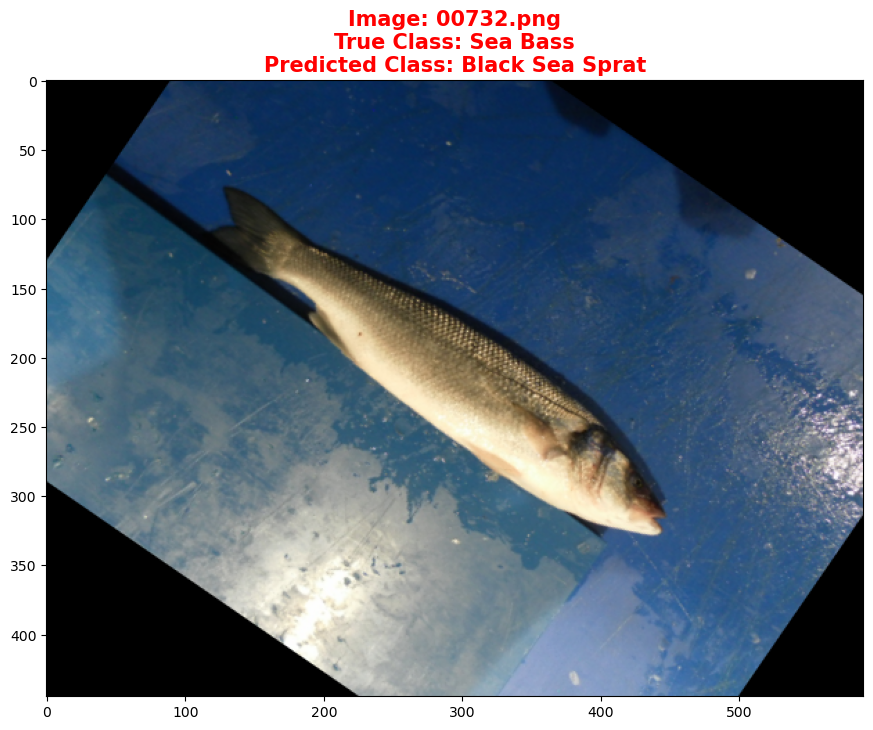

In [37]:
import os

# Check if pred_df contains data and has enough rows
if not pred_df.empty and len(pred_df) > 1:
    # Assuming you want to display the image at index 1
    plt.figure(figsize=(15, 8))
    plt.imshow(plt.imread(pred_df.path[1137]))

    # Split the path and extract relevant components
    title1 = os.path.basename(os.path.dirname(pred_df.path[1137]))
    title2 = os.path.basename(pred_df.path[1137])
    title3 = pred_df.pred[1137]

    # Display title with extracted components
    plt.title(f'Image: {title2}\nTrue Class: {title1}\nPredicted Class: {title3}', color='r', weight='bold', fontsize=15)
    plt.show()
else:
    print("pred_df is either empty or doesn't have enough rows to access index 1.")


Accuracy Score: 0.9933333333333333


<Axes: >

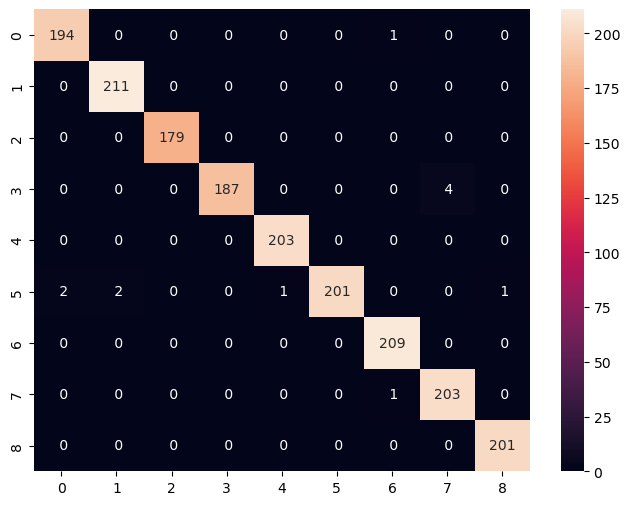

In [38]:
#Checking the accuracy score and creating a Confusion Matrix
print(f"Accuracy Score: {accuracy_score(pred_df['label'],pred_df['pred'])}")
plt.figure(figsize=(8,6))
sns.heatmap(confusion_matrix(pred_df['label'],pred_df['pred']), annot=True, fmt='2d')

In [39]:
#Generating the Classification Report for in-depth analysis
print(classification_report(pred_df['label'],pred_df['pred']))

                    precision    recall  f1-score   support

   Black Sea Sprat       0.99      0.99      0.99       195
   Gilt-Head Bream       0.99      1.00      1.00       211
   Hourse Mackerel       1.00      1.00      1.00       179
        Red Mullet       1.00      0.98      0.99       191
     Red Sea Bream       1.00      1.00      1.00       203
          Sea Bass       1.00      0.97      0.99       207
            Shrimp       0.99      1.00      1.00       209
Striped Red Mullet       0.98      1.00      0.99       204
             Trout       1.00      1.00      1.00       201

          accuracy                           0.99      1800
         macro avg       0.99      0.99      0.99      1800
      weighted avg       0.99      0.99      0.99      1800



# We have achieved an accuracy of 99, which clearly demonstrates the power of transfer learning.